In [53]:
import matplotlib.pyplot as plt
import torch
import os
import pandas as pd
import numpy as np

In [54]:
data_samp_path = '/Users/kuba/Documents/data/raw/kuba_twp5_watchdata_nov19/2024-09-10_12_42_48'

WINDOW_SIZE = 400
STRIDE = 50

In [55]:
#accl
accl_path = os.path.join(data_samp_path, "acceleration.csv")
#gyro
gyro_path = os.path.join(data_samp_path, "gyroscope.csv")

acc = pd.read_csv(accl_path, skiprows=1)
acc['timestamp']  = (acc['timestamp'] - acc['timestamp'].iloc[0]) * 1e-9 #subtract the start to get first time to be zero then convert from nano to sec
#first_row_acc = get_first_line(os.path.join(full_path, 'acceleration.csv'))

gyro = pd.read_csv(gyro_path, skiprows=1)
gyro['timestamp']  = (gyro['timestamp'] - gyro['timestamp'].iloc[0]) * 1e-9 #subtract the start to get first time to be zero then convert from nano to sec
#first_row_gyro = get_first_line(os.path.join(full_path, 'gyroscope.csv'))

In [56]:
len(acc) / 350

2116.9

In [57]:
x, y, z = acc['x'].to_numpy(), acc['y'].to_numpy(), acc['z'].to_numpy()

In [58]:
max = 100000

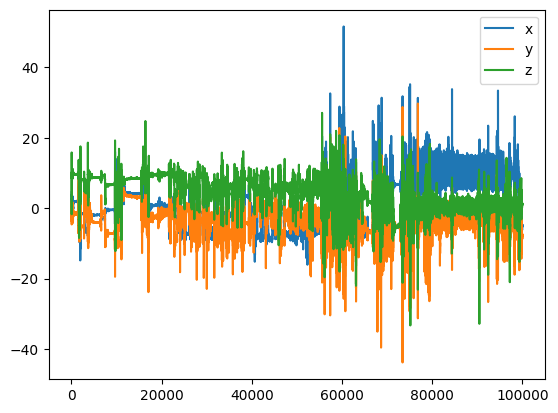

In [59]:
plt.plot(x[:max], label='x')
plt.plot(y[:max], label='y')
plt.plot(z[:max], label='z')
plt.legend()

LETS NOW MAKE SOME DATA TO PASS TO THE NN

In [60]:
def window_maker(data, window_size, stride, flatten):
    """Create windows from time series data."""
    windows = []
    
    if flatten:
        # Flatten x, y, z channels into a single vector per window
        for i in range(0, len(data['x']) - window_size + 1, stride):
            window = []
            window.extend(data['x'][i:i + window_size].tolist())
            window.extend(data['y'][i:i + window_size].tolist())
            window.extend(data['z'][i:i + window_size].tolist())
            windows.append(window)
    else:
        # Keep x, y, z as separate channels
        for i in range(0, len(data['x']) - window_size + 1, stride):
            window = [
                data['x'][i:i + window_size].tolist(),
                data['y'][i:i + window_size].tolist(),
                data['z'][i:i + window_size].tolist()
            ]
            windows.append(window)
            
    return windows


def process_recording(acc_data, gyro_data, window_size, stride, flatten):
    """Extract activity windows and labels from a recording."""

    if len(acc) >= window_size:
        acc_windows_batch = window_maker(acc_data, window_size, stride, flatten)
        gyro_windows_batch = window_maker(gyro_data, window_size, stride, flatten)

        # Handle potential mismatch in window counts
        min_windows = min(len(acc_windows_batch), len(gyro_windows_batch))
        acc_windows_batch = acc_windows_batch[:min_windows]
        gyro_windows_batch = gyro_windows_batch[:min_windows]
    
    return torch.tensor(acc_windows_batch), torch.tensor(gyro_windows_batch)

In [61]:
acc_windows, gyro_windows = process_recording(acc, gyro, window_size=WINDOW_SIZE, stride=STRIDE, flatten=False)
acc_windows.shape

torch.Size([14810, 3, 400])

In [62]:
all_windows = torch.cat((acc_windows, gyro_windows), dim=1)
all_windows.shape

torch.Size([14810, 6, 400])

now lets define the model

In [63]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class simple_cnn(nn.Module):
    def __init__(self, dropout=0.0):
        super().__init__()
        self.c0  = nn.Conv1d(6, 64, kernel_size=3, stride=2)

        self.c1  = nn.Conv1d(64, 128, kernel_size=3, stride=2)
        self.c2  = nn.Conv1d(128, 128, kernel_size=3)

        self.c3  = nn.Conv1d(128, 256, kernel_size=3, stride=2)
        self.c4  = nn.Conv1d(256, 256, kernel_size=3)
        self.c5  = nn.Conv1d(256, 256, kernel_size=3)

        self.gap = nn.AdaptiveAvgPool1d(1)
        self.l0 = nn.Linear(256,256)
        self.dropout = nn.Dropout(p=dropout)
        self.out = nn.Linear(256,1)
            
        
    def forward(self, x):
        x = F.relu(self.c0(x), inplace=True)
        
        x = F.relu(self.c1(x), inplace=True)
        x = F.relu(self.c2(x), inplace=True)
        
        x = F.relu(self.c3(x), inplace=True)
        x = F.relu(self.c4(x), inplace=True)
        x = F.relu(self.c5(x), inplace=True)
        
        x = self.gap(x).squeeze(-1)
        x = F.relu(self.l0(x), inplace=True)
        x = self.dropout(x)
        x = self.out(x)
        
        return x


In [64]:
model = simple_cnn()
model.load_state_dict(torch.load('/Users/kuba/projects/medication-taking-data/new_start/week00/93f1_fullleak.pth', weights_only=True))

<All keys matched successfully>

In [65]:
device = 'mps'
model = model.to(device)
all_windows = all_windows.to(device)
with torch.no_grad():
    model.eval()
    logits = model(all_windows)

The model was trained to where:
0 = daily life 
1 = medication 

In [66]:
preds = F.sigmoid(logits.cpu())
preds

tensor([[0.0553],
        [0.1269],
        [0.2060],
        ...,
        [0.0524],
        [0.0080],
        [0.0104]])

In [67]:
preds_list = preds.tolist()
preds_list = [val[0] for val in preds_list]
preds_list.reverse()

In [68]:
len(preds_list)

14810

In [69]:
len(acc)

740915

In [70]:
counts = np.zeros((len(acc)))
sums = np.zeros((len(acc)))

counts.shape, sums.shape

((740915,), (740915,))

In [71]:
len_to_use = min(len(acc) - WINDOW_SIZE, len(gyro) - WINDOW_SIZE) #Handle potential mismatch in window count
for i in range(0, len_to_use, STRIDE):
    val = preds_list.pop()
    sums[i : i+WINDOW_SIZE] += val
    counts[i : i+WINDOW_SIZE] += 1


In [72]:
def smooth_predictions(prediction_sum, counts):
    """
    Smooth predictions by averaging, handling divisions by zero.
    """

    averaged_predictions = prediction_sum / (counts + 0.00001)
    return averaged_predictions


In [73]:
avg_preds = smooth_predictions(sums, counts)

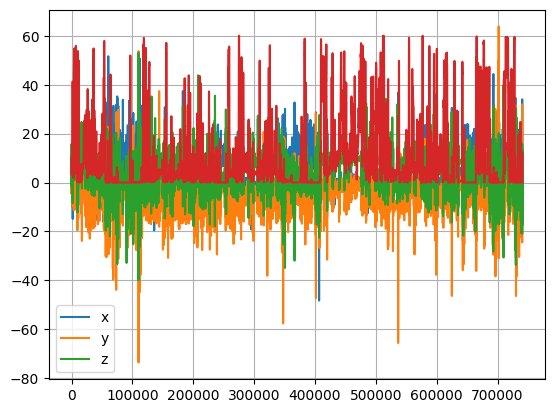

In [74]:
plt.plot(x, label='x')
plt.plot(y, label='y')
plt.plot(z, label='z')
plt.plot((avg_preds * 60))
plt.grid()
plt.legend()

In [75]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=list(range(len(x[300000:450000]))), y=x[300000:450000], mode='lines', name='x'))
fig.add_trace(go.Scatter(x=list(range(len(y[300000:450000]))), y=y[300000:450000], mode='lines', name='y'))
fig.add_trace(go.Scatter(x=list(range(len(z[300000:450000]))), y=z[300000:450000], mode='lines', name='z'))
fig.add_trace(go.Scatter(x=list(range(len(avg_preds[300000:450000]))), y=(avg_preds[300000:450000] * 40), mode='lines', name='avg_preds*40'))

# Update layout
fig.update_layout(
    title='Data Visualization',
    xaxis_title='Index',
    yaxis_title='Value',
    grid=dict(rows=1, columns=1),
    height=600,  # You can adjust height
    width=900    # You can adjust width
)

# Add grid
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey')

# Display the figure
fig.show()